<a href="https://colab.research.google.com/github/EjbejaranosAI/AI_trends_2023/blob/main/PoC/Smile_detection_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Smile detection


# Install neccesary packages

In [ ]:
!pip install -q mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 60.0 MB/s eta 0:00:00


## Cascade approach

In [ ]:
def extract_video_segements(video_path, time_length):
  cap = cv2.VideoCapture(video_path)
  fps = cap.get(cv2.CAP_PROP_FPS)
  total_frames = cap.get(cv2.CAP_PROP_FRAME_COUNT)
  print(f"FPS: {fps} - Total frames: {total_frames}")
  try:
    video_length = int(total_frames)/ int(fps)
    print(f"Video length: {video_length} secodns")
  except ZeroDivisionError:
    print("Could not get video length")

  first_frames = int(fps * time_length)
  final_frames = (total_frames - time_length *fps)


  video_start = []
  video_end = []
  for frame_num in range(int(total_frames)):
    ret, frame = cap.read()
    if not ret:
      break
    if frame_num < first_frames:
      video_start.append(frame)
      #make preditions      #TODO
    if frame_num >final_frames:
      video_end.append(frame)
  cap.release()

  save_video("start_segmentation.mp4",video_start,fps)
  save_video("end_segmentation.mp4", video_end, fps)

  return video_start, video_end


def save_video(output_path, frames, fps):
    height, width, _ = frames[0].shape
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
    for frame in frames:
        out.write(frame)
    out.release()

video_path = '/content/video2.mp4'
start_segment, final_segment = extract_video_segements(video_path, 1)


FPS: 24.0 - Total frames: 1371.0
Video length: 57.125 secodns


In [ ]:
import cv2
import mediapipe as mp
from google.colab.patches import cv2_imshow

import os
import numpy as np


class SmileDetector:
    def __init__(self):
        self.mp_face_detection = mp.solutions.face_detection
        self.mp_drawing = mp.solutions.drawing_utils
        self.smile_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_smile.xml')

    def detect(self, gray, frame):
        with self.mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
            rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            results = face_detection.process(rgb)
            predictions = []

            if results.detections:
                for detection in results.detections:
                    bbox = detection.location_data.relative_bounding_box
                    x, y, w, h = int(bbox.xmin * frame.shape[1]), int(bbox.ymin * frame.shape[0]), int(bbox.width * frame.shape[1]), int(bbox.height * frame.shape[0])

                    roi_gray = gray[y:y + h, x:x + w]

                    smiles = self.smile_cascade.detectMultiScale(roi_gray, 1.8, 20)

                    if len(smiles) > 0:
                        predictions.append(True)
                        cv2.rectangle(frame, (x, y), ((x + w), (y + h)), (0, 255, 0), 2)
                        cv2.putText(frame, 'Smiling', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
                    else:
                        predictions.append(False)
                        cv2.rectangle(frame, (x, y), ((x + w), (y + h)), (0, 0, 255), 2)
                        cv2.putText(frame, 'Not Smiling', (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)

            return predictions, frame

    def smile_detection(self, video_path, show_frames=True):
        video_capture = cv2.VideoCapture(video_path)
        fps = video_capture.get(cv2.CAP_PROP_FPS)
        frame_count = int(video_capture.get(cv2.CAP_PROP_FRAME_COUNT))
        smile_count = 0
        not_smile_count = 0

        predictions = []

        while video_capture.isOpened():
            ret, frame = video_capture.read()

            if not ret:
                break

            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

            frame_predictions, annotated_frame = self.detect(gray, frame)
            predictions.extend(frame_predictions)

            smile_count += sum(frame_predictions)
            not_smile_count += len(frame_predictions) - sum(frame_predictions)

            if show_frames:
                #cv2.imshow('Smile Detection', annotated_frame)
                cv2_imshow(annotated_frame)

            if cv2.waitKey(1) & 0xFF == ord('q'):
                break

        video_capture.release()
        cv2.destroyAllWindows()

        seconds = frame_count / fps
        smile_percentage = (smile_count / frame_count) * 100
        not_smile_percentage = (not_smile_count / frame_count) * 100

        return smile_count, not_smile_count, smile_percentage, not_smile_percentage, seconds





- smile_count: The total number of smiling frames detected.
- not_smile_count: The total number of not smiling frames detected.
- smile_percentage: The percentage of smiling frames in the video.
- not_smile_percentage: The percentage of not smiling frames in the video.
- seconds: The duration of the video in seconds.

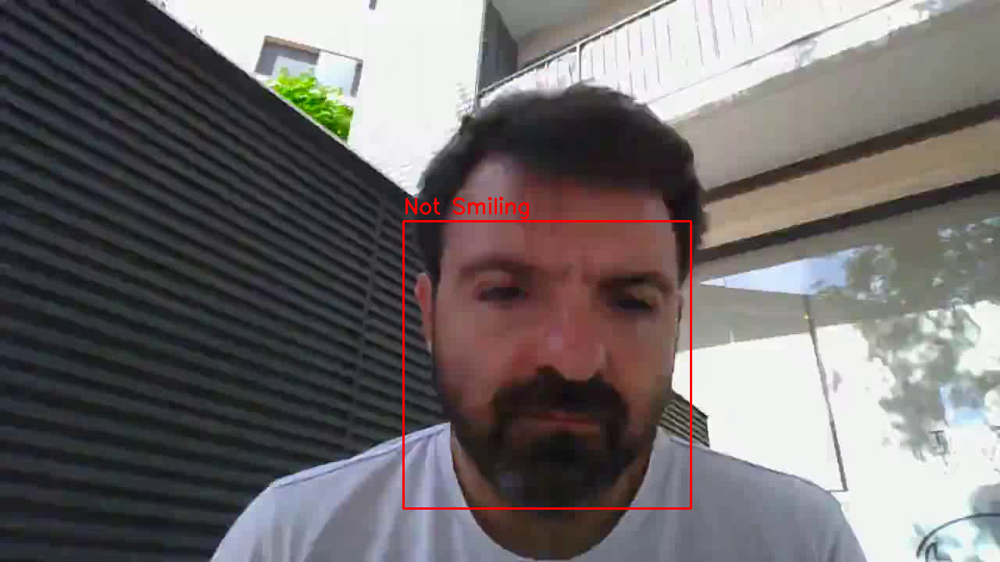

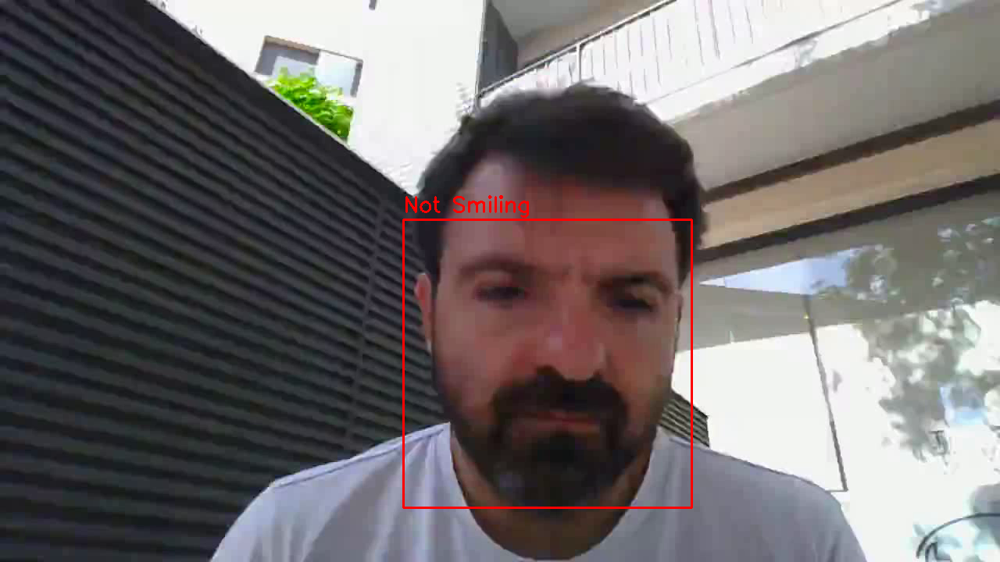

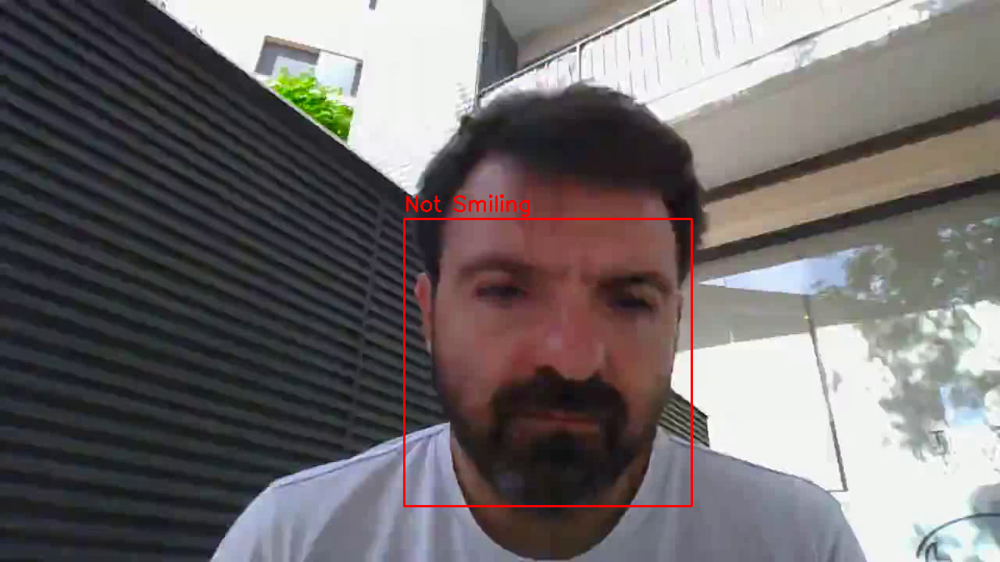

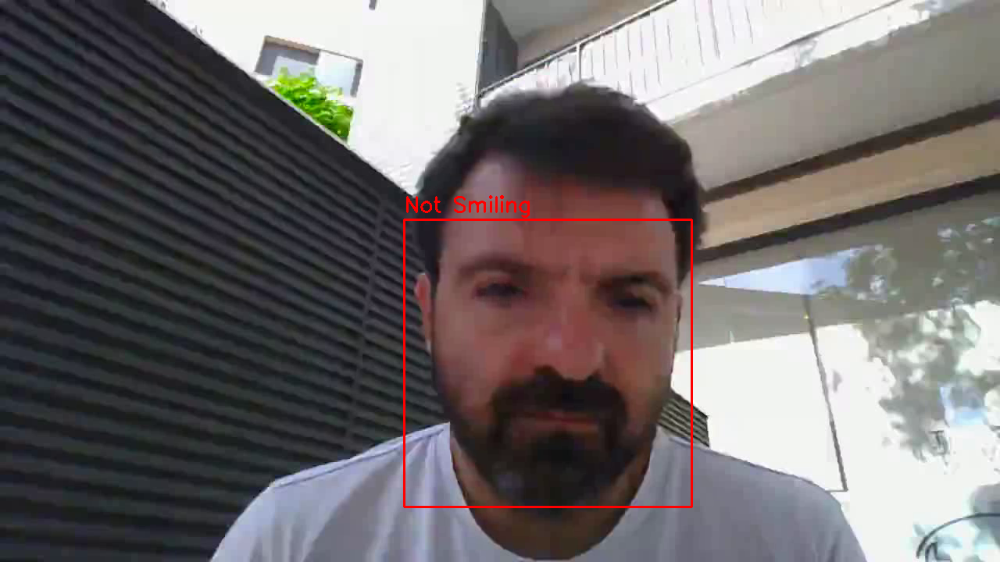

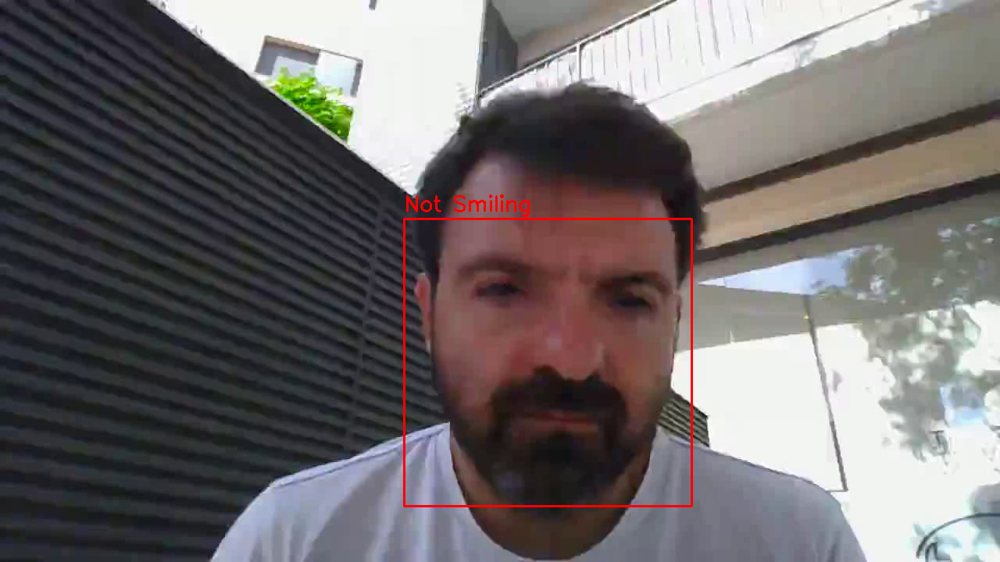

...

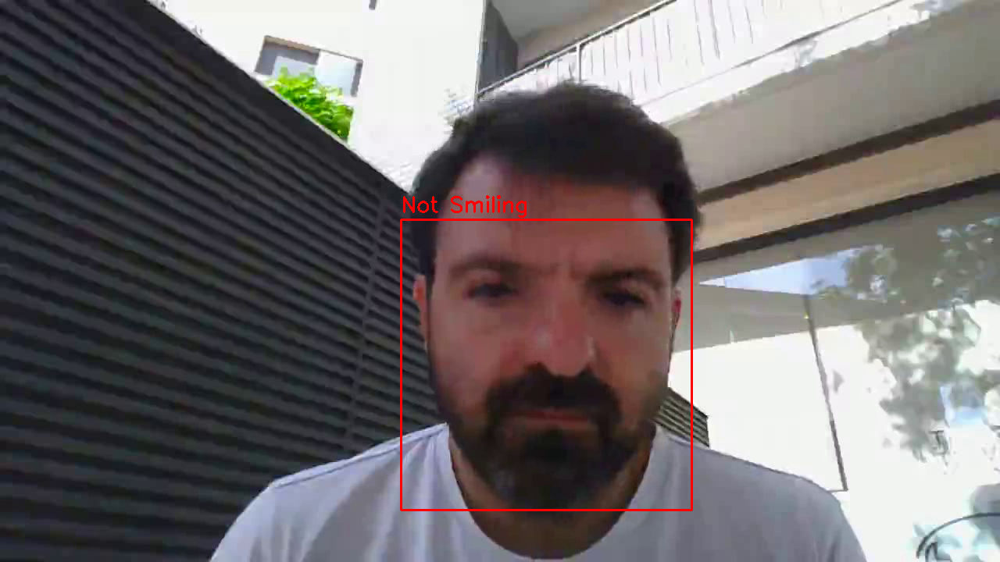

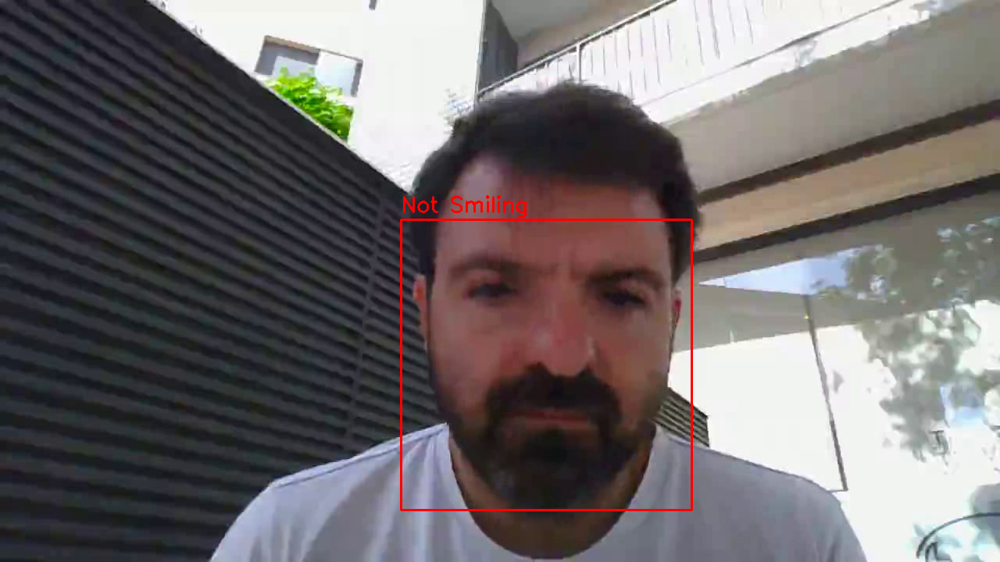

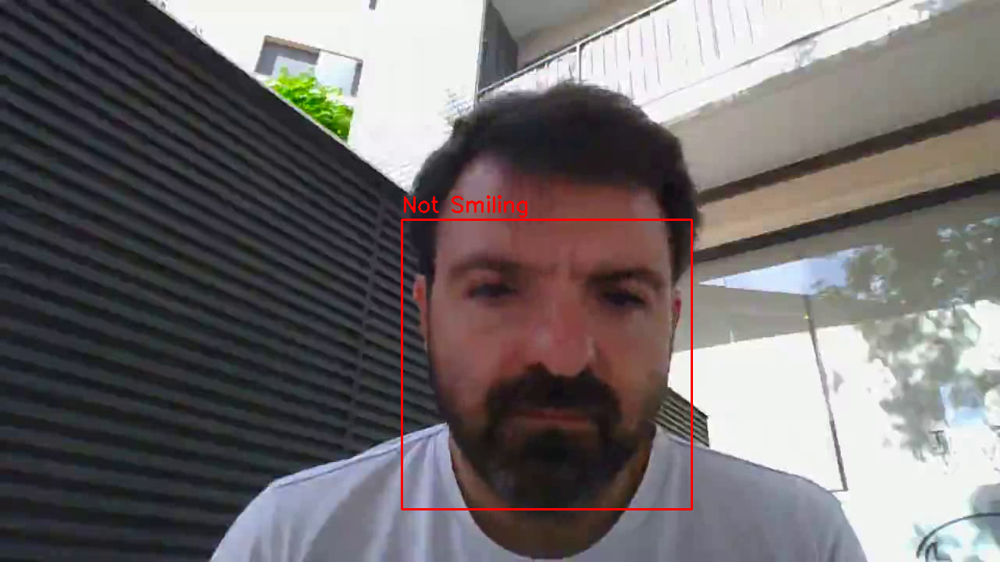

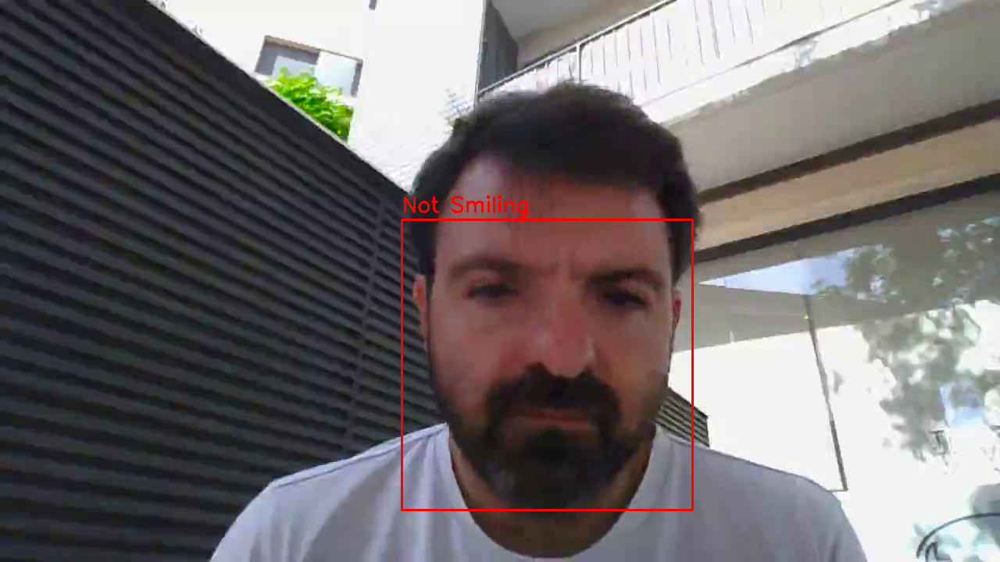

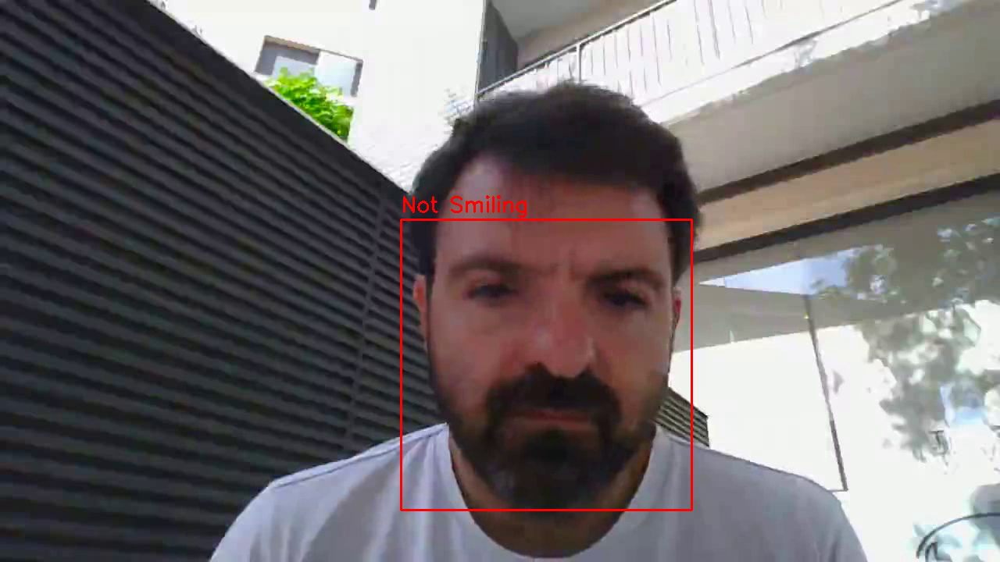

Count smiling: 1
Count not smiling: 23
Smiling percentage: 4.166666666666666
Not smiling percentage: 95.83333333333334


In [ ]:
smile_detector = SmileDetector()
video_path = "/content/start_segmentation.mp4"
result = smile_detector.smile_detection(video_path, show_frames=True)

smile_count = result[0]
not_smile_count = result[1]
smile_percentage = result[2]
not_smile_percentage = result[3]
seconds = result[4]

print(f"Count smiling: {smile_count}")
print(f"Count not smiling: {not_smile_count}")
print(f"Smiling percentage: {smile_percentage}")
print(f"Not smiling percentage: {not_smile_percentage}")

In [ ]:
smile_detector = SmileDetector()
video_path = "/content/end_segmentation.mp4"
result = smile_detector.smile_detection(video_path, show_frames=False)

smile_count = result[0]
not_smile_count = result[1]
smile_percentage = result[2]
not_smile_percentage = result[3]
seconds = result[4]

print(f"Count smiling: {smile_count}")
print(f"Count not smiling: {not_smile_count}")
print(f"Smiling percentage: {smile_percentage}")
print(f"Not smiling percentage: {not_smile_percentage}")

Count smiling: 11
Count not smiling: 12
Smiling percentage: 47.82608695652174
Not smiling percentage: 52.17391304347826


# Smile detection with deep learning

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"edisonjbejarano","key":"7078f3b4ce909623e63e732b9a06e141"}'}

In [1]:
import os
import numpy as np
import PIL
import PIL.Image
import tensorflow as tf
import tensorflow_datasets as tfds

path_smile_dataset = '/content/drive/MyDrive/PoC_AI/Lernmi/smile_detection/dataset'

In [2]:
!cp -r "/content/drive/MyDrive/PoC_AI/Lernmi/smile_detection/dataset" "dataset/"

In [3]:
path_data = "/content/dataset"
list_sets = os.listdir(path_data)
for set_data in list_sets:
  print(set_data)


smile
test
non_smile


(64, 64, 3)


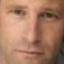

In [4]:
import cv2
from google.colab.patches import cv2_imshow

image_path = "/content/dataset/non_smile/Aaron_Eckhart_0001.jpg"
image = cv2.imread(image_path)
print(image.shape)
cv2_imshow(image)


### Paramenters

In [29]:
batch_size = 32
img_height = 64 #80
img_width = 64 #

In [32]:
batch_size = 32
img_height = 64 #80
img_width = 64 #

#@title
train_ds = tf.keras.utils.image_dataset_from_directory(
  path_data,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


val_ds = tf.keras.utils.image_dataset_from_directory(
  path_data,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


class_names = train_ds.class_names
print(class_names)

Found 1203 files belonging to 2 classes.
Using 963 files for training.
Found 1203 files belonging to 2 classes.
Using 240 files for validation.
['non_smile', 'smile']


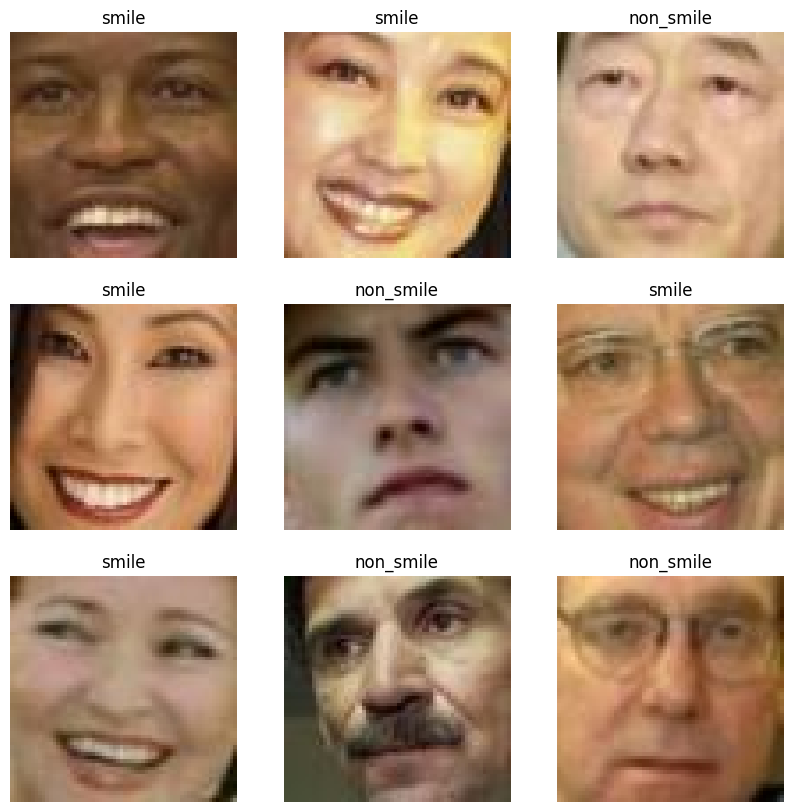

In [33]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

# CNN trained from scratch

In [34]:
normalization_layer = tf.keras.layers.Rescaling(1./255)

In [35]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [42]:
num_classes = 5

model = tf.keras.Sequential([
  tf.keras.layers.Rescaling(1./255),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(num_classes)
])

In [43]:
model.compile(
  optimizer='adam',
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

In [44]:
model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=20
)

Epoch 1/20
31/31 [==============================] - 8s 184ms/step - loss: 0.7363 - accuracy: 0.5337 - val_loss: 0.6682 - val_accuracy: 0.5583
Epoch 2/20
31/31 [==============================] - 8s 245ms/step - loss: 0.5610 - accuracy: 0.7259 - val_loss: 0.3532 - val_accuracy: 0.8667
Epoch 3/20
31/31 [==============================] - 5s 165ms/step - loss: 0.3298 - accuracy: 0.8702 - val_loss: 0.4948 - val_accuracy: 0.8000
Epoch 4/20
31/31 [==============================] - 6s 198ms/step - loss: 0.2832 - accuracy: 0.8827 - val_loss: 0.2194 - val_accuracy: 0.9125
Epoch 5/20
31/31 [==============================] - 8s 250ms/step - loss: 0.2059 - accuracy: 0.9263 - val_loss: 0.2208 - val_accuracy: 0.9042
Epoch 6/20
31/31 [==============================] - 5s 171ms/step - loss: 0.1680 - accuracy: 0.9439 - val_loss: 0.2000 - val_accuracy: 0.9333
Epoch 7/20
31/31 [==============================] - 6s 182ms/step - loss: 0.1448 - accuracy: 0.9502 - val_loss: 0.2189 - val_accuracy: 0.9167
Epoch 

## Fine-tunning

In [19]:
mobile = tf.keras.applications.mobilenet.MobileNet()
mobile.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                                         

In [6]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall

x = mobile.layers[-5].output
x = tf.keras.layers.Reshape(target_shape=(1024,))(x)
output = tf.keras.layers.Dense(units=2, activation='softmax')(x)

model = Model(inputs=mobile.input, outputs=output)
for layer in model.layers[:-22]:
    layer.trainable = False

batch_size = 32
img_height = 224
img_width = 224

train_ds = tf.keras.utils.image_dataset_from_directory(
    path_data,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
    path_data,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size)

# One-hot encode the target variables within the map function
train_ds = train_ds.map(lambda x, y: (x, tf.one_hot(y, depth=2)))
val_ds = val_ds.map(lambda x, y: (x, tf.one_hot(y, depth=2)))

model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall()])

model.fit(x=train_ds,
          validation_data=val_ds,
          epochs=20,
          verbose=2)


Found 1203 files belonging to 3 classes.
Using 963 files for training.
Found 1203 files belonging to 3 classes.
Using 240 files for validation.
Epoch 1/20
31/31 - 18s - loss: 0.1401 - accuracy: 0.5566 - precision: 0.4424 - recall: 0.9006 - val_loss: 3.0663 - val_accuracy: 0.4583 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - 18s/epoch - 568ms/step
Epoch 2/20
31/31 - 2s - loss: 0.0722 - accuracy: 0.6023 - precision: 0.4881 - recall: 0.9937 - val_loss: 2.7850 - val_accuracy: 0.4583 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - 2s/epoch - 57ms/step
Epoch 3/20
31/31 - 1s - loss: 0.0669 - accuracy: 0.6044 - precision: 0.4912 - recall: 1.0000 - val_loss: 1.8141 - val_accuracy: 0.4542 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - 1s/epoch - 48ms/step
Epoch 4/20
31/31 - 2s - loss: 0.0648 - accuracy: 0.6282 - precision: 0.4901 - recall: 0.9979 - val_loss: 0.5479 - val_accuracy: 0.5083 - val_precision: 0.1458 - val_recall: 0.2692 - 2s/epoch - 57ms/step
Epoch 5/20
31/31 

In [16]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import f1_score

# Define the F1 score metric function
def f1_metric(y_true, y_pred):
    true_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true * y_pred, 0, 1)))
    predicted_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_pred, 0, 1)))
    actual_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true, 0, 1)))

    precision = true_positives / (predicted_positives + tf.keras.backend.epsilon())
    recall = true_positives / (actual_positives + tf.keras.backend.epsilon())

    f1 = 2 * precision * recall / (precision + recall + tf.keras.backend.epsilon())
    return f1


x = mobile.layers[-5].output
x = tf.keras.layers.Reshape(target_shape=(1024,))(x)
output = tf.keras.layers.Dense(units=2, activation='softmax')(x)

model = Model(inputs=mobile.input, outputs=output)
for layer in model.layers[:-22]:
    layer.trainable = False

batch_size = 32
img_height = 224
img_width = 224

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

train_ds = datagen.flow_from_directory(
    path_data,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    seed=123
)

val_ds = datagen.flow_from_directory(
    path_data,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    seed=123
)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(x=train_ds,
          validation_data=val_ds,
          epochs=50)




Found 963 images belonging to 2 classes.
Found 240 images belonging to 2 classes.
Epoch 1/20
31/31 [==============================] - 24s 552ms/step - loss: 1.2051 - accuracy: 0.6023 - val_loss: 2.7701 - val_accuracy: 0.5167
Epoch 2/20
31/31 [==============================] - 16s 513ms/step - loss: 0.5482 - accuracy: 0.7331 - val_loss: 2.3382 - val_accuracy: 0.5042
Epoch 3/20
31/31 [==============================] - 16s 509ms/step - loss: 0.4575 - accuracy: 0.7767 - val_loss: 1.6585 - val_accuracy: 0.5417
Epoch 4/20
31/31 [==============================] - 17s 550ms/step - loss: 0.4431 - accuracy: 0.8017 - val_loss: 0.9553 - val_accuracy: 0.6167
Epoch 5/20
31/31 [==============================] - 17s 543ms/step - loss: 0.3835 - accuracy: 0.8390 - val_loss: 0.5529 - val_accuracy: 0.7167
Epoch 6/20
31/31 [==============================] - 25s 823ms/step - loss: 0.3869 - accuracy: 0.8214 - val_loss: 0.4219 - val_accuracy: 0.7917
Epoch 7/20
31/31 [==============================] - 16s 508m

In [26]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix
import numpy as np


mobile = tf.keras.applications.mobilenet.MobileNet()
x = mobile.layers[-5].output
x = tf.keras.layers.Reshape(target_shape=(1024,))(x)
output = tf.keras.layers.Dense(units=2, activation='softmax')(x)

model = Model(inputs=mobile.input, outputs=output)
for layer in model.layers[:-22]:
    layer.trainable = False

batch_size = 64
img_height = 224
img_width = 224

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    validation_split=0.15
)

datagen_val = ImageDataGenerator(
    rotation_range=20,
    validation_split=0.15
)

train_ds = datagen.flow_from_directory(
    path_data,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    seed=123
)

val_ds = datagen_val.flow_from_directory(
    path_data,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    seed=123
)

test_ds = datagen_val.flow_from_directory(
    path_data,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',  # Use 5% for test set
    shuffle=False,  # Avoid shuffling for proper evaluation
    seed=123
)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(x=train_ds,
                    validation_data=val_ds,
                    epochs=50)



Found 1023 images belonging to 2 classes.
Found 180 images belonging to 2 classes.
Found 180 images belonging to 2 classes.
Epoch 1/50
16/16 [==============================] - 22s 1s/step - loss: 0.6721 - accuracy: 0.6315 - val_loss: 0.7167 - val_accuracy: 0.5444
Epoch 2/50
16/16 [==============================] - 17s 1s/step - loss: 0.5191 - accuracy: 0.7302 - val_loss: 0.8277 - val_accuracy: 0.5056
Epoch 3/50
16/16 [==============================] - 16s 1s/step - loss: 0.4583 - accuracy: 0.8084 - val_loss: 1.5056 - val_accuracy: 0.5000
Epoch 4/50
16/16 [==============================] - 16s 997ms/step - loss: 0.4098 - accuracy: 0.8104 - val_loss: 0.8130 - val_accuracy: 0.5056
Epoch 5/50
16/16 [==============================] - 16s 993ms/step - loss: 0.3756 - accuracy: 0.8456 - val_loss: 0.6530 - val_accuracy: 0.6167
Epoch 6/50
16/16 [==============================] - 16s 994ms/step - loss: 0.3677 - accuracy: 0.8377 - val_loss: 0.5183 - val_accuracy: 0.7444
Epoch 7/50
16/16 [=========

In [27]:
# Generate predictions on the test set
y_true = test_ds.labels
y_pred = model.predict(test_ds)
y_pred = np.argmax(y_pred, axis=1)

# Create confusion matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:")
print(cm)

3/3 [==============================] - 4s 885ms/step
Confusion Matrix:
[[89  1]
 [30 60]]


In [24]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import LearningRateScheduler
from sklearn.metrics import confusion_matrix
import numpy as np


mobile = tf.keras.applications.mobilenet.MobileNet()
x = mobile.layers[-5].output
x = tf.keras.layers.Reshape(target_shape=(1024,))(x)
output = tf.keras.layers.Dense(units=2, activation='softmax')(x)

model = Model(inputs=mobile.input, outputs=output)
for layer in model.layers[:-22]:
    layer.trainable = False

batch_size = 64
img_height = 224
img_width = 224

# Define data directories
train_data_dir = '/content/dataset'

# Data augmentation for training set only
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Data generator for training set
train_ds = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=123
)

# Data generator for validation set
val_ds = tf.keras.utils.image_dataset_from_directory(
    train_data_dir,
    validation_split=0.15,
    subset='validation',
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

# Learning rate scheduler
def lr_scheduler(epoch, lr):
    if epoch < 10:
        return lr  # Keep initial learning rate for first 10 epochs
    else:
        return lr * tf.math.exp(-0.1)  # Exponential decay with factor 0.1

# Create learning rate scheduler callback
lr_callback = LearningRateScheduler(lr_scheduler)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    x=train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[lr_callback]
)




Found 1203 images belonging to 2 classes.
Found 1203 files belonging to 2 classes.
Using 180 files for validation.
Epoch 1/50
19/19 [==============================] - ETA: 0s - loss: 0.6789 - accuracy: 0.6101

ValueError: ignored

In [ ]:
# Generate predictions on the test set
y_true = test_ds.classes
y_pred = model.predict(test_ds)
y_pred = np.argmax(y_pred, axis=1)

# Create confusion matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix:")
print(cm)